<a href="https://colab.research.google.com/github/chaladi-tulasi/Nakshatra/blob/main/High_resolution_images.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
!pip install torch torchvision
import torch

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("Using device:", device)

Using device: cuda


In [2]:
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import DataLoader, Dataset
from torchvision import transforms
from torchvision.utils import save_image
from PIL import Image
import os

In [3]:
DATA_DIR = '/content/drive/MyDrive/AstroSR-main/dataset/HSC_train_HR'
SAVED_IMAGES = '/content/drive/MyDrive/srgan_results/'
os.makedirs(SAVED_IMAGES, exist_ok=True)

In [4]:
import os
from PIL import Image

DATA_DIR = '/content/drive/MyDrive/AstroSR-main/dataset/HSC_train_HR'

image_files = [f for f in os.listdir(DATA_DIR) if f.endswith(('.jpg', '.png', '.jpeg'))]
print(f"Found {len(image_files)} images in DATA_DIR.")


Found 2000 images in DATA_DIR.


In [5]:
LR_SIZE = (64, 64)
HR_SIZE = (256, 256)
BATCH_SIZE = 32
LEARNING_RATE = 0.0002

class SRDataset(Dataset):
    def __init__(self, root_dir, transform=None):
        self.root_dir = root_dir
        self.transform = transform
        self.image_paths = sorted([os.path.join(root_dir, f) for f in os.listdir(root_dir) if f.endswith(('.jpg', '.png'))])

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, idx):
        image = Image.open(self.image_paths[idx]).convert('RGB')
        lr_image = self.transform['lr'](image)
        hr_image = self.transform['hr'](image)
        return lr_image, hr_image

transform = {
    'lr': transforms.Compose([transforms.Resize(LR_SIZE), transforms.ToTensor()]),
    'hr': transforms.Compose([transforms.Resize(HR_SIZE), transforms.ToTensor()])
}

dataset = SRDataset(DATA_DIR, transform)
data_loader = DataLoader(dataset, batch_size=BATCH_SIZE, shuffle=True)

In [6]:
class ResidualBlock(nn.Module):
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.block = nn.Sequential(
            nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_channels),
            nn.PReLU(),
            nn.Conv2d(in_channels, in_channels, kernel_size=3, stride=1, padding=1),
            nn.BatchNorm2d(in_channels)
        )

    def forward(self, x):
        return x + self.block(x)

class Generator(nn.Module):
    def __init__(self, in_channels=3, num_residuals=16):
        super(Generator, self).__init__()
        self.conv1 = nn.Sequential(nn.Conv2d(in_channels, 64, kernel_size=9, stride=1, padding=4), nn.PReLU())
        self.res_blocks = nn.Sequential(*[ResidualBlock(64) for _ in range(num_residuals)])
        self.conv2 = nn.Sequential(nn.Conv2d(64, 64, kernel_size=3, stride=1, padding=1), nn.BatchNorm2d(64))
        self.upscale = nn.Sequential(
            nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1),
            nn.PixelShuffle(2),
            nn.PReLU(),
            nn.Conv2d(64, 256, kernel_size=3, stride=1, padding=1),
            nn.PixelShuffle(2),
            nn.PReLU()
        )
        self.conv3 = nn.Conv2d(64, in_channels, kernel_size=9, stride=1, padding=4)

    def forward(self, x):
        x = self.conv1(x)
        residual = x
        x = self.res_blocks(x)
        x = self.conv2(x) + residual
        x = self.upscale(x)
        x = self.conv3(x)
        return x

class Discriminator(nn.Module):
    def __init__(self, in_channels=3):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_channels, 64, kernel_size=3, stride=1, padding=1),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Conv2d(64, 128, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Conv2d(128, 256, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Conv2d(256, 512, kernel_size=3, stride=2, padding=1),
            nn.BatchNorm2d(512),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.AdaptiveAvgPool2d((6, 6)),
            nn.Flatten(),
            nn.Linear(512 * 6 * 6, 1024),
            nn.LeakyReLU(0.2),
            nn.Dropout(0.3),
            nn.Linear(1024, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)

generator = Generator().to(device)
discriminator = Discriminator().to(device)

In [7]:
mse_loss = nn.MSELoss()
bce_loss = nn.BCELoss()
optimizer_D = optim.AdamW(discriminator.parameters(), lr=LEARNING_RATE, betas=(0.9, 0.999))
optimizer_G = optim.AdamW(generator.parameters(), lr=LEARNING_RATE, betas=(0.9, 0.999))

In [8]:
torch.save(generator.state_dict(), "generator.pth")
torch.save(discriminator.state_dict(), "discriminator.pth")
print("Models saved successfully.")

Models saved successfully.


Epoch [0/20], Batch [0/63], D Loss: 0.3072, G Loss: 0.0038
Epoch [0/20], Batch [10/63], D Loss: 0.0506, G Loss: 0.0152
Epoch [0/20], Batch [20/63], D Loss: 0.2223, G Loss: 0.0354
Epoch [0/20], Batch [30/63], D Loss: 0.4576, G Loss: 0.0242
Epoch [0/20], Batch [40/63], D Loss: 0.0833, G Loss: 0.0089
Epoch [0/20], Batch [50/63], D Loss: 0.0431, G Loss: 0.0087
Epoch [0/20], Batch [60/63], D Loss: 0.2575, G Loss: 0.0077
Sample image saved at epoch 0


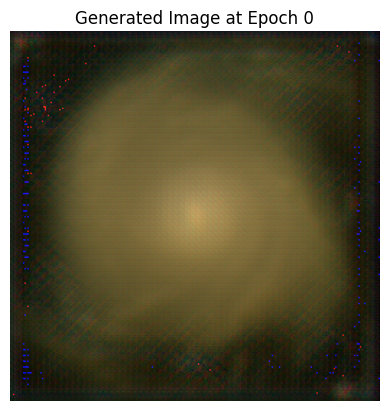

Epoch [1/20], Batch [0/63], D Loss: 0.6570, G Loss: 0.0084
Epoch [1/20], Batch [10/63], D Loss: 0.2331, G Loss: 0.0045
Epoch [1/20], Batch [20/63], D Loss: 0.1575, G Loss: 0.0059
Epoch [1/20], Batch [30/63], D Loss: 0.3094, G Loss: 0.0062
Epoch [1/20], Batch [40/63], D Loss: 0.2115, G Loss: 0.0060
Epoch [1/20], Batch [50/63], D Loss: 0.1023, G Loss: 0.0066
Epoch [1/20], Batch [60/63], D Loss: 0.0863, G Loss: 0.0059
Sample image saved at epoch 1


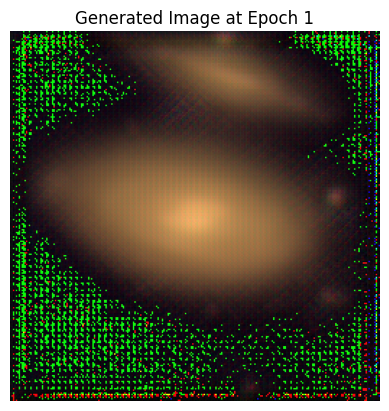

Epoch [2/20], Batch [0/63], D Loss: 0.0925, G Loss: 0.0064
Epoch [2/20], Batch [10/63], D Loss: 0.0634, G Loss: 0.0072
Epoch [2/20], Batch [20/63], D Loss: 0.0472, G Loss: 0.0081
Epoch [2/20], Batch [30/63], D Loss: 0.0354, G Loss: 0.0078
Epoch [2/20], Batch [40/63], D Loss: 0.0479, G Loss: 0.0065
Epoch [2/20], Batch [50/63], D Loss: 0.0886, G Loss: 0.0072
Epoch [2/20], Batch [60/63], D Loss: 0.0647, G Loss: 0.0070
Sample image saved at epoch 2


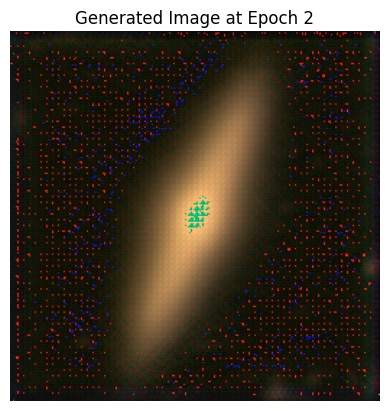

Epoch [3/20], Batch [0/63], D Loss: 0.0596, G Loss: 0.0069
Epoch [3/20], Batch [10/63], D Loss: 0.0477, G Loss: 0.0066
Epoch [3/20], Batch [20/63], D Loss: 0.0719, G Loss: 0.0071
Epoch [3/20], Batch [30/63], D Loss: 0.0690, G Loss: 0.0057
Epoch [3/20], Batch [40/63], D Loss: 0.0577, G Loss: 0.0103
Epoch [3/20], Batch [50/63], D Loss: 0.0476, G Loss: 0.0099
Epoch [3/20], Batch [60/63], D Loss: 0.1788, G Loss: 0.0087
Sample image saved at epoch 3


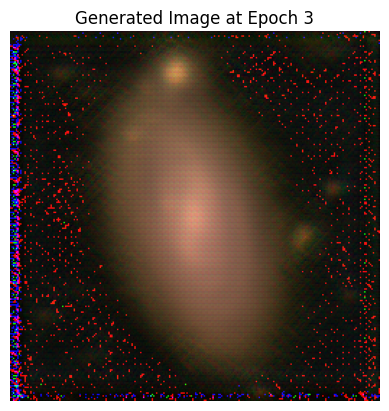

Epoch [4/20], Batch [0/63], D Loss: 0.1551, G Loss: 0.0067
Epoch [4/20], Batch [10/63], D Loss: 0.1313, G Loss: 0.0063
Epoch [4/20], Batch [20/63], D Loss: 0.1494, G Loss: 0.0072
Epoch [4/20], Batch [30/63], D Loss: 0.4353, G Loss: 0.0072
Epoch [4/20], Batch [40/63], D Loss: 0.1184, G Loss: 0.0084
Epoch [4/20], Batch [50/63], D Loss: 0.0250, G Loss: 0.0087
Epoch [4/20], Batch [60/63], D Loss: 0.0843, G Loss: 0.0093
Sample image saved at epoch 4


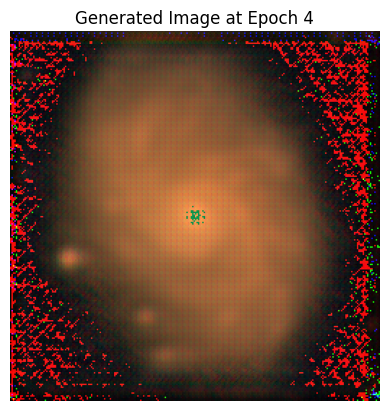

Epoch [5/20], Batch [0/63], D Loss: 0.1288, G Loss: 0.0071
Epoch [5/20], Batch [10/63], D Loss: 0.0449, G Loss: 0.0060
Epoch [5/20], Batch [20/63], D Loss: 0.0810, G Loss: 0.0096
Epoch [5/20], Batch [30/63], D Loss: 0.3003, G Loss: 0.0059
Epoch [5/20], Batch [40/63], D Loss: 0.1813, G Loss: 0.0071
Epoch [5/20], Batch [50/63], D Loss: 0.1118, G Loss: 0.0099
Epoch [5/20], Batch [60/63], D Loss: 0.1160, G Loss: 0.0062
Sample image saved at epoch 5


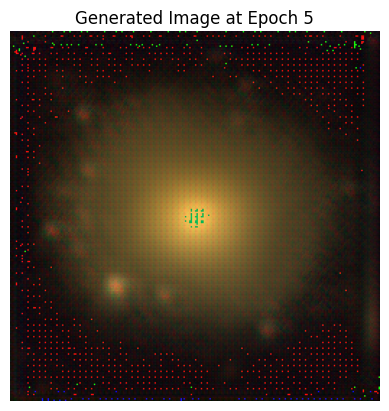

Epoch [6/20], Batch [0/63], D Loss: 0.1463, G Loss: 0.0091
Epoch [6/20], Batch [10/63], D Loss: 0.1318, G Loss: 0.0063
Epoch [6/20], Batch [20/63], D Loss: 0.2194, G Loss: 0.0073
Epoch [6/20], Batch [30/63], D Loss: 0.0142, G Loss: 0.0093
Epoch [6/20], Batch [40/63], D Loss: 0.0749, G Loss: 0.0095
Epoch [6/20], Batch [50/63], D Loss: 0.2366, G Loss: 0.0071
Epoch [6/20], Batch [60/63], D Loss: 0.1084, G Loss: 0.0067
Sample image saved at epoch 6


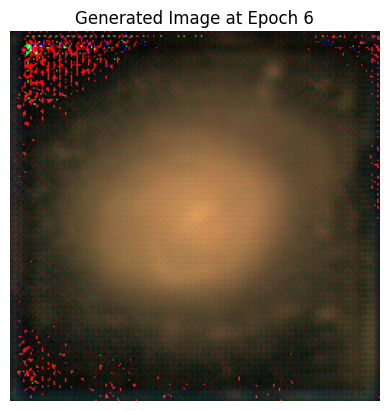

Epoch [7/20], Batch [0/63], D Loss: 0.2600, G Loss: 0.0076
Epoch [7/20], Batch [10/63], D Loss: 0.1665, G Loss: 0.0091
Epoch [7/20], Batch [20/63], D Loss: 0.0926, G Loss: 0.0064
Epoch [7/20], Batch [30/63], D Loss: 0.0937, G Loss: 0.0064
Epoch [7/20], Batch [40/63], D Loss: 0.0419, G Loss: 0.0080
Epoch [7/20], Batch [50/63], D Loss: 0.1529, G Loss: 0.0079
Epoch [7/20], Batch [60/63], D Loss: 0.1142, G Loss: 0.0078
Sample image saved at epoch 7


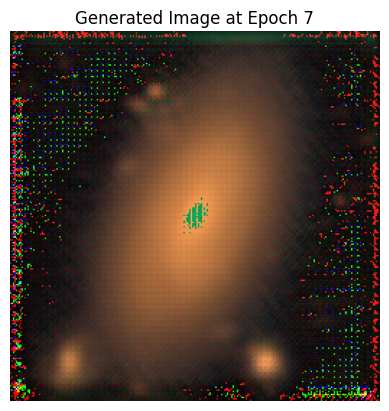

Epoch [8/20], Batch [0/63], D Loss: 0.4645, G Loss: 0.0066
Epoch [8/20], Batch [10/63], D Loss: 0.1839, G Loss: 0.0069
Epoch [8/20], Batch [20/63], D Loss: 0.1547, G Loss: 0.0083
Epoch [8/20], Batch [30/63], D Loss: 0.1459, G Loss: 0.0091
Epoch [8/20], Batch [40/63], D Loss: 0.2259, G Loss: 0.0058
Epoch [8/20], Batch [50/63], D Loss: 0.0607, G Loss: 0.0082
Epoch [8/20], Batch [60/63], D Loss: 0.1584, G Loss: 0.0071
Sample image saved at epoch 8


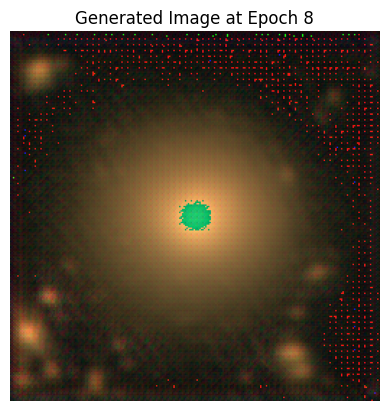

Epoch [9/20], Batch [0/63], D Loss: 0.2047, G Loss: 0.0076
Epoch [9/20], Batch [10/63], D Loss: 0.1103, G Loss: 0.0086
Epoch [9/20], Batch [20/63], D Loss: 0.1852, G Loss: 0.0083
Epoch [9/20], Batch [30/63], D Loss: 0.1226, G Loss: 0.0077
Epoch [9/20], Batch [40/63], D Loss: 0.4220, G Loss: 0.0088
Epoch [9/20], Batch [50/63], D Loss: 0.0739, G Loss: 0.0068
Epoch [9/20], Batch [60/63], D Loss: 0.1003, G Loss: 0.0070
Sample image saved at epoch 9


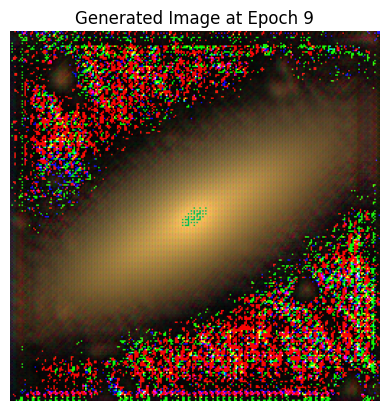

Epoch [10/20], Batch [0/63], D Loss: 0.0894, G Loss: 0.0073
Epoch [10/20], Batch [10/63], D Loss: 0.0995, G Loss: 0.0062
Epoch [10/20], Batch [20/63], D Loss: 0.2238, G Loss: 0.0058
Epoch [10/20], Batch [30/63], D Loss: 0.0685, G Loss: 0.0084
Epoch [10/20], Batch [40/63], D Loss: 0.3823, G Loss: 0.0055
Epoch [10/20], Batch [50/63], D Loss: 0.2293, G Loss: 0.0072
Epoch [10/20], Batch [60/63], D Loss: 0.1141, G Loss: 0.0073
Sample image saved at epoch 10


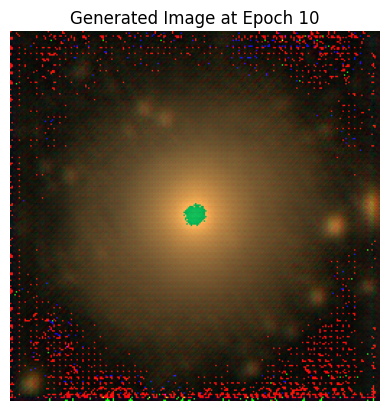

Epoch [11/20], Batch [0/63], D Loss: 0.1041, G Loss: 0.0052
Epoch [11/20], Batch [10/63], D Loss: 0.2070, G Loss: 0.0073
Epoch [11/20], Batch [20/63], D Loss: 0.1121, G Loss: 0.0068
Epoch [11/20], Batch [30/63], D Loss: 0.1155, G Loss: 0.0076
Epoch [11/20], Batch [40/63], D Loss: 0.4312, G Loss: 0.0073
Epoch [11/20], Batch [50/63], D Loss: 0.2842, G Loss: 0.0080
Epoch [11/20], Batch [60/63], D Loss: 0.3341, G Loss: 0.0077
Sample image saved at epoch 11


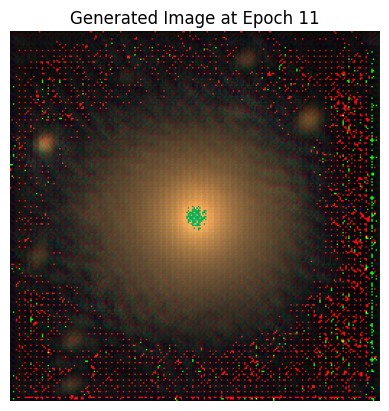

Epoch [12/20], Batch [0/63], D Loss: 0.1961, G Loss: 0.0061
Epoch [12/20], Batch [10/63], D Loss: 0.0552, G Loss: 0.0082
Epoch [12/20], Batch [20/63], D Loss: 0.1105, G Loss: 0.0063
Epoch [12/20], Batch [30/63], D Loss: 0.5402, G Loss: 0.0046
Epoch [12/20], Batch [40/63], D Loss: 0.2360, G Loss: 0.0086
Epoch [12/20], Batch [50/63], D Loss: 0.2075, G Loss: 0.0076
Epoch [12/20], Batch [60/63], D Loss: 0.0806, G Loss: 0.0071
Sample image saved at epoch 12


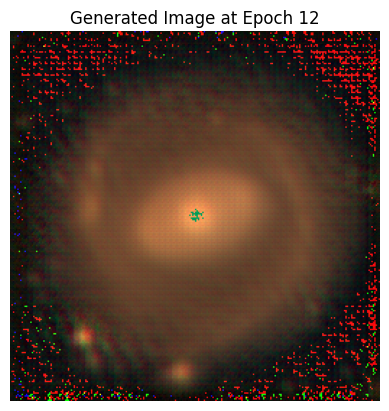

Epoch [13/20], Batch [0/63], D Loss: 0.0863, G Loss: 0.0064
Epoch [13/20], Batch [10/63], D Loss: 0.1432, G Loss: 0.0062
Epoch [13/20], Batch [20/63], D Loss: 0.1649, G Loss: 0.0074
Epoch [13/20], Batch [30/63], D Loss: 0.4414, G Loss: 0.0076
Epoch [13/20], Batch [40/63], D Loss: 0.2015, G Loss: 0.0062
Epoch [13/20], Batch [50/63], D Loss: 0.8998, G Loss: 0.0104
Epoch [13/20], Batch [60/63], D Loss: 0.4908, G Loss: 0.0092
Sample image saved at epoch 13


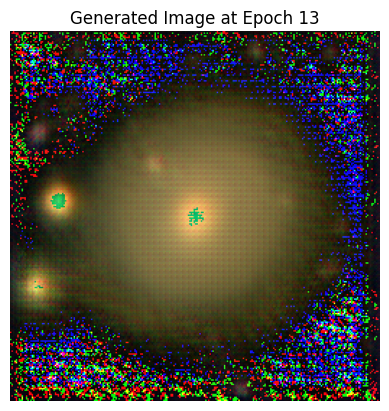

Epoch [14/20], Batch [0/63], D Loss: 0.1128, G Loss: 0.0069
Epoch [14/20], Batch [10/63], D Loss: 0.0878, G Loss: 0.0062
Epoch [14/20], Batch [20/63], D Loss: 0.2733, G Loss: 0.0080
Epoch [14/20], Batch [30/63], D Loss: 0.2175, G Loss: 0.0073
Epoch [14/20], Batch [40/63], D Loss: 0.2380, G Loss: 0.0071
Epoch [14/20], Batch [50/63], D Loss: 0.1501, G Loss: 0.0060
Epoch [14/20], Batch [60/63], D Loss: 0.2763, G Loss: 0.0073
Sample image saved at epoch 14


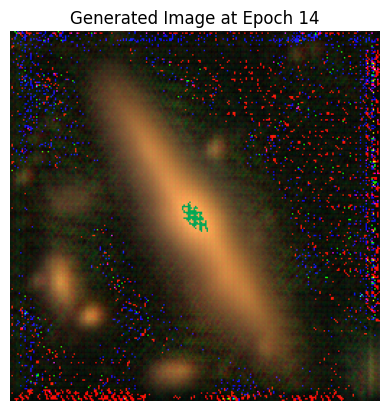

Epoch [15/20], Batch [0/63], D Loss: 0.4305, G Loss: 0.0049
Epoch [15/20], Batch [10/63], D Loss: 0.2164, G Loss: 0.0076
Epoch [15/20], Batch [20/63], D Loss: 0.1089, G Loss: 0.0071
Epoch [15/20], Batch [30/63], D Loss: 0.1721, G Loss: 0.0076
Epoch [15/20], Batch [40/63], D Loss: 0.1219, G Loss: 0.0058
Epoch [15/20], Batch [50/63], D Loss: 0.4589, G Loss: 0.0049
Epoch [15/20], Batch [60/63], D Loss: 0.1387, G Loss: 0.0071
Sample image saved at epoch 15


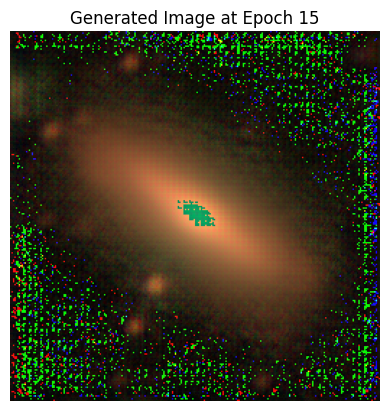

Epoch [16/20], Batch [0/63], D Loss: 0.2917, G Loss: 0.0058
Epoch [16/20], Batch [10/63], D Loss: 0.2449, G Loss: 0.0068
Epoch [16/20], Batch [20/63], D Loss: 0.1301, G Loss: 0.0064
Epoch [16/20], Batch [30/63], D Loss: 0.2216, G Loss: 0.0059
Epoch [16/20], Batch [40/63], D Loss: 0.4467, G Loss: 0.0061
Epoch [16/20], Batch [50/63], D Loss: 0.5137, G Loss: 0.0057
Epoch [16/20], Batch [60/63], D Loss: 0.4252, G Loss: 0.0079
Sample image saved at epoch 16


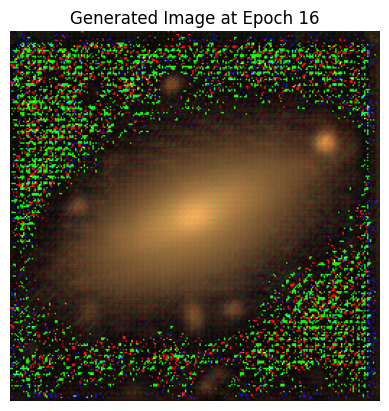

Epoch [17/20], Batch [0/63], D Loss: 0.2359, G Loss: 0.0063
Epoch [17/20], Batch [10/63], D Loss: 0.3462, G Loss: 0.0059
Epoch [17/20], Batch [20/63], D Loss: 0.3294, G Loss: 0.0063
Epoch [17/20], Batch [30/63], D Loss: 0.1040, G Loss: 0.0084
Epoch [17/20], Batch [40/63], D Loss: 0.2651, G Loss: 0.0066
Epoch [17/20], Batch [50/63], D Loss: 0.2685, G Loss: 0.0057
Epoch [17/20], Batch [60/63], D Loss: 0.2704, G Loss: 0.0048
Sample image saved at epoch 17


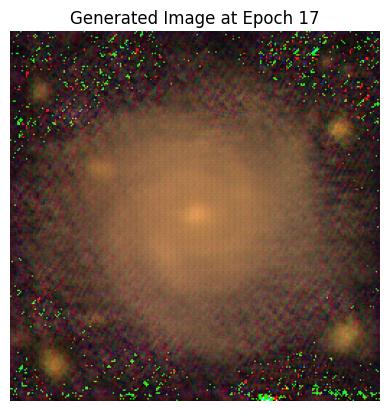

Epoch [18/20], Batch [0/63], D Loss: 0.1933, G Loss: 0.0086
Epoch [18/20], Batch [10/63], D Loss: 0.1842, G Loss: 0.0054
Epoch [18/20], Batch [20/63], D Loss: 0.4204, G Loss: 0.0052
Epoch [18/20], Batch [30/63], D Loss: 0.3593, G Loss: 0.0053
Epoch [18/20], Batch [40/63], D Loss: 0.1863, G Loss: 0.0068
Epoch [18/20], Batch [50/63], D Loss: 0.3399, G Loss: 0.0055
Epoch [18/20], Batch [60/63], D Loss: 0.3979, G Loss: 0.0055
Sample image saved at epoch 18


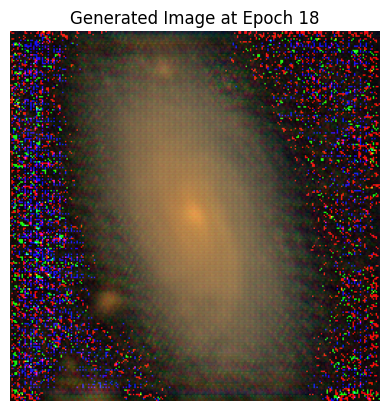

Epoch [19/20], Batch [0/63], D Loss: 0.3100, G Loss: 0.0063
Epoch [19/20], Batch [10/63], D Loss: 1.2491, G Loss: 0.0048
Epoch [19/20], Batch [20/63], D Loss: 0.3471, G Loss: 0.0094
Epoch [19/20], Batch [30/63], D Loss: 0.4255, G Loss: 0.0083
Epoch [19/20], Batch [40/63], D Loss: 0.0990, G Loss: 0.0073
Epoch [19/20], Batch [50/63], D Loss: 0.3339, G Loss: 0.0076
Epoch [19/20], Batch [60/63], D Loss: 0.3826, G Loss: 0.0058
Sample image saved at epoch 19


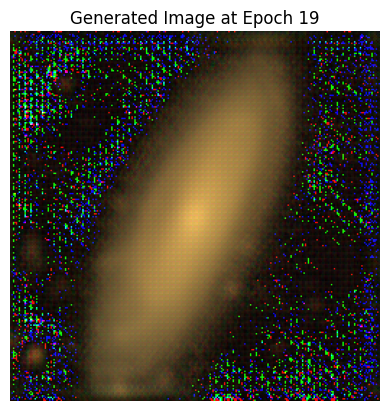

In [17]:
import matplotlib.pyplot as plt
from torchvision.transforms.functional import to_pil_image
from torchvision.utils import save_image
import torch

EPOCHS = 20
for epoch in range(EPOCHS):
    for i, (lr_imgs, hr_imgs) in enumerate(data_loader):
        lr_imgs = lr_imgs.to(device)
        hr_imgs = hr_imgs.to(device)

        optimizer_D.zero_grad()
        gen_hr_imgs = generator(lr_imgs)
        real_loss = bce_loss(discriminator(hr_imgs), torch.ones((hr_imgs.size(0), 1), device=device))
        fake_loss = bce_loss(discriminator(gen_hr_imgs.detach()), torch.zeros((lr_imgs.size(0), 1), device=device))
        d_loss = (real_loss + fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()
        g_loss = mse_loss(gen_hr_imgs, hr_imgs) + 1e-3 * bce_loss(discriminator(gen_hr_imgs), torch.ones((lr_imgs.size(0), 1), device=device))
        g_loss.backward()
        optimizer_G.step()

        if i % 10 == 0:
            print(f"Epoch [{epoch}/{EPOCHS}], Batch [{i}/{len(data_loader)}], D Loss: {d_loss.item():.4f}, G Loss: {g_loss.item():.4f}")

    if epoch % 1 == 0:
        sample_image_path = f"{SAVED_IMAGES}/epoch_{epoch}.png"
        save_image(gen_hr_imgs, sample_image_path)
        print(f"Sample image saved at epoch {epoch}")
        gen_image_pil = to_pil_image(gen_hr_imgs[0].cpu().detach())
        plt.imshow(gen_image_pil)
        plt.axis('off')
        plt.title(f"Generated Image at Epoch {epoch}")
        plt.show()

In [18]:
def load_model_and_infer(generator_model_path, lr_image_path):
    generator = Generator()
    generator.load_state_dict(torch.load(generator_model_path))
    generator.to(device)
    generator.eval()
    lr_image = Image.open(lr_image_path).convert("RGB")
    lr_image = transforms.ToTensor()(lr_image).unsqueeze(0).to(device)

    with torch.no_grad():
        gen_hr_image = generator(lr_image)

    save_image(gen_hr_image, "generated_hr_image.png")
    gen_image_pil = to_pil_image(gen_hr_image[0].cpu().detach())
    plt.imshow(gen_image_pil)
    plt.axis('off')
    plt.title("Generated High-Resolution Image")
    plt.show()

<ipython-input-18-31e5e3b282f1>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(generator_model_path))


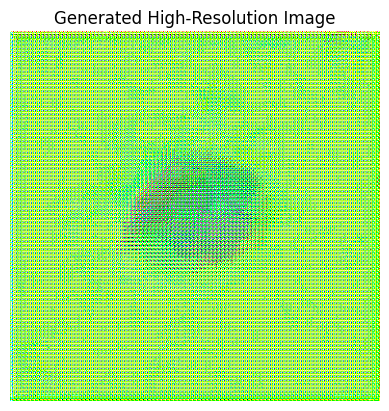

In [19]:
load_model_and_infer("generator.pth", "/content/drive/MyDrive/AstroSR-main/dataset/SDSS_test_LR/X2/133.40822_4.224727.png")

<ipython-input-10-31e5e3b282f1>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(generator_model_path))


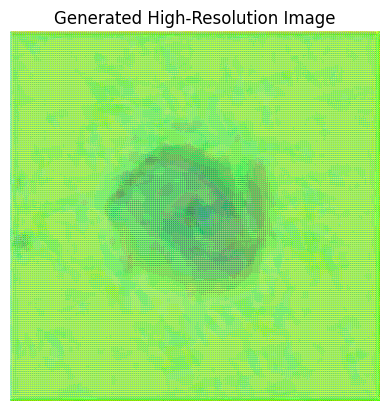

In [12]:
load_model_and_infer("generator.pth", "/content/drive/MyDrive/AstroSR-main/dataset/SDSS_test_Bilinear/17.49903_-0.45353034.png")

<ipython-input-10-31e5e3b282f1>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(generator_model_path))


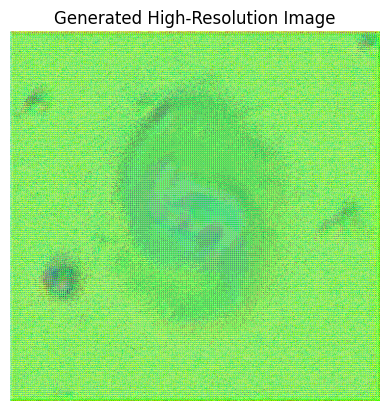

In [13]:
load_model_and_infer("generator.pth", "/content/drive/MyDrive/AstroSR-main/dataset/HSC_test_HR/135.36111_3.4140265.png")

<ipython-input-10-31e5e3b282f1>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(generator_model_path))


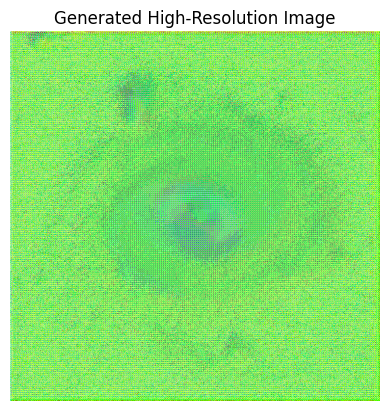

In [14]:
load_model_and_infer("generator.pth", "/content/drive/MyDrive/AstroSR-main/dataset/HSC_test_HR/141.02951_2.3688948.png")

<ipython-input-10-31e5e3b282f1>:3: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  generator.load_state_dict(torch.load(generator_model_path))


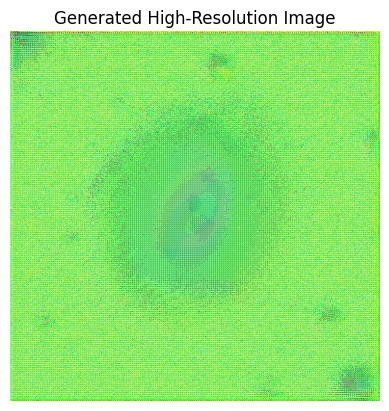

In [15]:
load_model_and_infer("generator.pth", "/content/drive/MyDrive/AstroSR-main/dataset/HSC_test_HR/132.99406_4.416162.png")

In [20]:
import matplotlib.pyplot as plt

d_losses = []
g_losses = []

EPOCHS = 20
for epoch in range(EPOCHS):
    epoch_d_loss = 0.0
    epoch_g_loss = 0.0
    for i, (lr_imgs, hr_imgs) in enumerate(data_loader):
        lr_imgs = lr_imgs.to(device)
        hr_imgs = hr_imgs.to(device)

        optimizer_D.zero_grad()
        gen_hr_imgs = generator(lr_imgs)
        real_loss = bce_loss(discriminator(hr_imgs), torch.ones((hr_imgs.size(0), 1), device=device))
        fake_loss = bce_loss(discriminator(gen_hr_imgs.detach()), torch.zeros((lr_imgs.size(0), 1), device=device))
        d_loss = (real_loss + fake_loss) / 2
        d_loss.backward()
        optimizer_D.step()

        optimizer_G.zero_grad()
        g_loss = mse_loss(gen_hr_imgs, hr_imgs) + 1e-3 * bce_loss(discriminator(gen_hr_imgs), torch.ones((lr_imgs.size(0), 1), device=device))
        g_loss.backward()
        optimizer_G.step()

        epoch_d_loss += d_loss.item()
        epoch_g_loss += g_loss.item()

    d_losses.append(epoch_d_loss / len(data_loader))
    g_losses.append(epoch_g_loss / len(data_loader))

    print(f"Epoch [{epoch+1}/{EPOCHS}], D Loss: {epoch_d_loss / len(data_loader):.4f}, G Loss: {epoch_g_loss / len(data_loader):.4f}")

    sample_image_path = f"{SAVED_IMAGES}/epoch_{epoch+1}.png"
    save_image(gen_hr_imgs, sample_image_path)
    print(f"Sample image saved at epoch {epoch+1}")


Epoch [1/20], D Loss: 0.3734, G Loss: 0.0067
Sample image saved at epoch 1
Epoch [2/20], D Loss: 0.2756, G Loss: 0.0064
Sample image saved at epoch 2
Epoch [3/20], D Loss: 0.2448, G Loss: 0.0066
Sample image saved at epoch 3
Epoch [4/20], D Loss: 0.2411, G Loss: 0.0059
Sample image saved at epoch 4
Epoch [5/20], D Loss: 0.3110, G Loss: 0.0060
Sample image saved at epoch 5
Epoch [6/20], D Loss: 0.2856, G Loss: 0.0061
Sample image saved at epoch 6
Epoch [7/20], D Loss: 0.2335, G Loss: 0.0063
Sample image saved at epoch 7
Epoch [8/20], D Loss: 0.3271, G Loss: 0.0066
Sample image saved at epoch 8
Epoch [9/20], D Loss: 0.3517, G Loss: 0.0061
Sample image saved at epoch 9
Epoch [10/20], D Loss: 0.2623, G Loss: 0.0061
Sample image saved at epoch 10
Epoch [11/20], D Loss: 0.3310, G Loss: 0.0061
Sample image saved at epoch 11
Epoch [12/20], D Loss: 0.2829, G Loss: 0.0054
Sample image saved at epoch 12
Epoch [13/20], D Loss: 0.3152, G Loss: 0.0056
Sample image saved at epoch 13
Epoch [14/20], D 

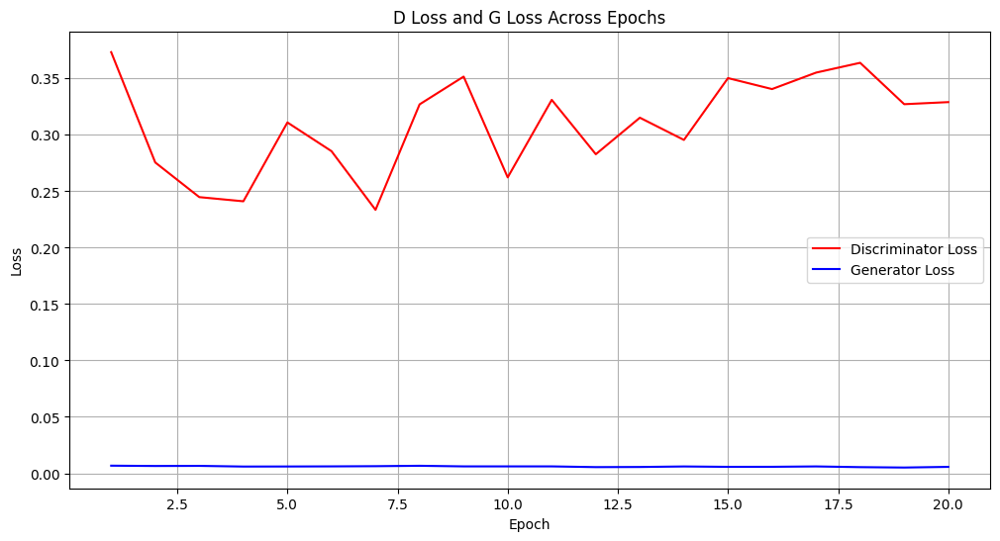

In [21]:
plt.figure(figsize=(12, 6))

plt.plot(range(1, EPOCHS+1), d_losses, label='Discriminator Loss', color='red')
plt.plot(range(1, EPOCHS+1), g_losses, label='Generator Loss', color='blue')

plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('D Loss and G Loss Across Epochs')
plt.legend()
plt.grid()
plt.show()

In [46]:
import cv2
from skimage.metrics import structural_similarity as ssim
import numpy as np

def calculate_psnr(img1, img2):
    mse = np.mean((img1 - img2) ** 2)
    if mse == 0:
        return 100
    max_pixel = 255.0
    psnr = 20 * np.log10(max_pixel / np.sqrt(mse))
    return psnr

def calculate_ssim(img1, img2):
    if len(img1.shape) == 3:
        img1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    if len(img2.shape) == 3:
        img2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    return ssim(img1, img2)

def evaluate_model(generator, data_loader, device):
    total_psnr = 0
    total_ssim = 0
    num_samples = 0

    for data in data_loader:
        if isinstance(data, (list, tuple)):
            input_imgs, target_imgs = data
        else:
            input_imgs = data['input']
            target_imgs = data['target']
        input_imgs = input_imgs.to(device)
        target_imgs = target_imgs.to(device)
        output_imgs = generator(input_imgs)
        for i in range(output_imgs.size(0)):
            output_img = output_imgs[i].cpu().detach()
            target_img = target_imgs[i].cpu().detach()
            output_img = output_img.numpy().transpose(1, 2, 0)
            target_img = target_img.numpy().transpose(1, 2, 0)
            output_img = (output_img * 255).astype(np.uint8)
            target_img = (target_img * 255).astype(np.uint8)
            psnr_value = calculate_psnr(output_img, target_img)
            ssim_value = calculate_ssim(output_img, target_img)
            total_psnr += psnr_value
            total_ssim += ssim_value
            num_samples += 1
    avg_psnr = total_psnr / num_samples
    avg_ssim = total_ssim / num_samples
    print(f"Average PSNR: {avg_psnr:.2f} dB")
    print(f"Average SSIM: {avg_ssim:.4f}")
    return avg_psnr, avg_ssim

evaluate_model(generator, data_loader, device)

Average PSNR: 29.82 dB
Average SSIM: 0.4683


(29.82425716862485, 0.468339835235795)